# Fig2_ICIM_clustering

In [2]:
from __future__ import division
import sys
import random
import copy
import math
import json

import numpy as np
import pandas as pd
import scipy

%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib as mpl

import seaborn as sns

sys.path.append("../resources/")
import sct
reload(sct)

sns.set_style("ticks")
sns.set_context("talk")

output_dir = "out/"
output_suffix = ""
output_formats = [".png", ".pdf"]

def save_figure(fig, name):
    for output_format in output_formats:
        fig.savefig(output_dir + "/" + name + output_suffix + output_format)
    return None

mpl.rc('savefig', dpi=300)

pd.options.mode.chained_assignment = None  # default='warn'

# Load data and libs

In [3]:
df_logCPM_all = pd.read_csv("../data/htseq_logCPM_hq.tab.gz", sep="\t", header=0, index_col=0) # CPM

df_libs = pd.read_csv("../data/libs_color3.csv", sep=",", header=0, index_col=0) # sample info

# select good ORNs

In [4]:
# Load names of high quality neurons (3/6 markers), cutoff 
names_hq_neurons = []
with open ("../data/names_hq_neurons.txt") as f:
    for line in f:
        names_hq_neurons.append(line.rstrip())
        
# Get names of GH146+ PNs
selector = ((df_libs["genotype"] == "GH146-GFP") & (df_libs["num_cells"] ==1))
names_PN = [x for x in list(df_logCPM_all.columns) if x in df_libs.loc[selector].index and x in names_hq_neurons]
print "PNs", len(names_PN)

# Get names of ORNs
selector0 = (df_libs["label"] == "nSyb_48h_ORN_P0") 
selector1 = (df_libs["label"] == "nSyb_48h_ORN_P1")
selector2 = (df_libs["label"] == "nSyb_48h_ORN_P2")
selector3 = (df_libs["label"] == "nSyb_48h_ORN_P4")
names_ORN = [x for x in list(df_logCPM_all.columns) if ((x in df_libs.loc[selector0].index) 
                      or (x in df_libs.loc[selector1].index) 
                      or (x in df_libs.loc[selector2].index)
                      or (x in df_libs.loc[selector3].index))
                      and x in names_hq_neurons]
print "ORN", len(names_ORN)

# Get names new P4 85A10_ORNs
selector = (df_libs["label"] == "85A10_48h_ORN_P4") 
names_85A10_ORN = [x for x in list(df_logCPM_all.columns) if ((x in df_libs.loc[selector].index) and x in names_hq_neurons)]
print "New_85A10_ORN_P4", len(names_85A10_ORN)

# Get names AM29_ORNs
selector = (df_libs["label"] == "Am29_48h_ORN_P4") 
names_AM29_ORN = [x for x in list(df_logCPM_all.columns) if ((x in df_libs.loc[selector].index) and x in names_hq_neurons)]
print "AM29_ORN", len(names_AM29_ORN)

PNs 976
ORN 908
New_85A10_ORN_P4 63
AM29_ORN 45


In [21]:
# Filter for these cells
names_PN_nsyb_ORN = names_PN + names_ORN 
names_All_ORN = names_ORN + names_85A10_ORN +names_AM29_ORN
names_PN_All_ORN = names_PN + names_All_ORN

df_PN = df_logCPM_all[list(names_PN)]
df_PN_ORN = df_logCPM_all[list(names_PN_All_ORN)]
df_All_ORN = df_logCPM_all[list(names_All_ORN)]

df_AM29_ORN = df_logCPM_all[list(names_AM29_ORN)]
df_85A10_ORN = df_logCPM_all[list(names_85A10_ORN)]

print "PN:", df_PN.shape[1]
print "PN_All_ORN:", df_PN_ORN.shape[1]
print "ORN_All:", df_All_ORN.shape[1]
print "AM29_ORN:", df_AM29_ORN.shape[1]
print "85A10_ORN:", df_85A10_ORN.shape[1]

# Display number of cells of each genotype to confirm
#df_libs.loc[df.columns]["genotype"].value_counts()

PN: 976
PN_All_ORN: 1992
ORN_All: 1016
AM29_ORN: 45
85A10_ORN: 63


In [19]:
#df_All_ORN.to_csv("../data/htseq_logCPM_hq_ORN.csv",sep=',')

In [7]:
df_All_ORN.head()

,N447Barcode_701-503,N447Barcode_701-505,N447Barcode_701-506,N447Barcode_701-513,N447Barcode_701-515,N447Barcode_701-516,N447Barcode_701-517,N447Barcode_701-518,N447Barcode_702-502,N447Barcode_702-503,...,N543Barcode_728-513,N543Barcode_728-517,N543Barcode_728-518,N543Barcode_728-522,N543Barcode_729-502,N543Barcode_729-503,N543Barcode_729-507,N543Barcode_729-508,N543Barcode_729-515,N543Barcode_729-520
symbol,,,,,,,,,,,,,,,,,,,,,
7SLRNA:CR32864,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
a,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
abd-A,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
Abd-B,6.701669,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,1.303427,0.0,0.0,0.0,0.0,0.0,0.000000
Abl,7.073998,9.736092,0.0,1.062355,0.0,4.025291,7.221597,0.0,12.041007,8.882172,...,7.822507,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,7.256223


# ICIM plot 

In [22]:
# please refer the link below for identifying ICIM genes
# https://github.com/felixhorns/FlyPN

# Load ICIM genes and plot tSNE 

In [23]:
X = df_All_ORN
X.shape

(15908, 1016)

In [25]:
names_ORN_ICIM = []
with open("../data/ICIM_ORN_408_Genes.txt") as f:
    for line in f:
        names_ORN_ICIM.append(line.rstrip())
print "names_ORN_ICIM", len(names_ORN_ICIM)

names_ORN_ICIM 408


In [26]:
X.shape
Z = X.loc[names_ORN_ICIM]
Z.shape

(408, 1016)

In [60]:
df_libs = pd.read_csv("../data/libs_color3_PN_ORN.csv", sep=",", header=0, index_col=0) # sample info

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1016
[t-SNE] Computed conditional probabilities for sample 1016 / 1016
[t-SNE] Mean sigma: 0.214192
[t-SNE] Iteration 25: error = 1.9991512, gradient norm = 0.0079487
[t-SNE] Iteration 50: error = 1.7835026, gradient norm = 0.0059780
[t-SNE] Iteration 75: error = 1.2907323, gradient norm = 0.0023776
[t-SNE] Iteration 100: error = 1.2215338, gradient norm = 0.0020045
[t-SNE] Error after 100 iterations with early exaggeration: 1.221534
[t-SNE] Iteration 125: error = 1.1194519, gradient norm = 0.0015110
[t-SNE] Iteration 150: error = 1.0901717, gradient norm = 0.0013704
[t-SNE] Iteration 175: error = 1.0831081, gradient norm = 0.0013386
[t-SNE] Iteration 200: error = 1.0812049, gradient norm = 0.0013296
[t-SNE] Iteration 225: error = 1.0806830, gradient norm = 0.0013255
[t-SNE] Iteration 250: error = 1.0805309, gradient norm = 0.0013245
[t-SNE] Iteration 275: error = 1.0804955, gradient 

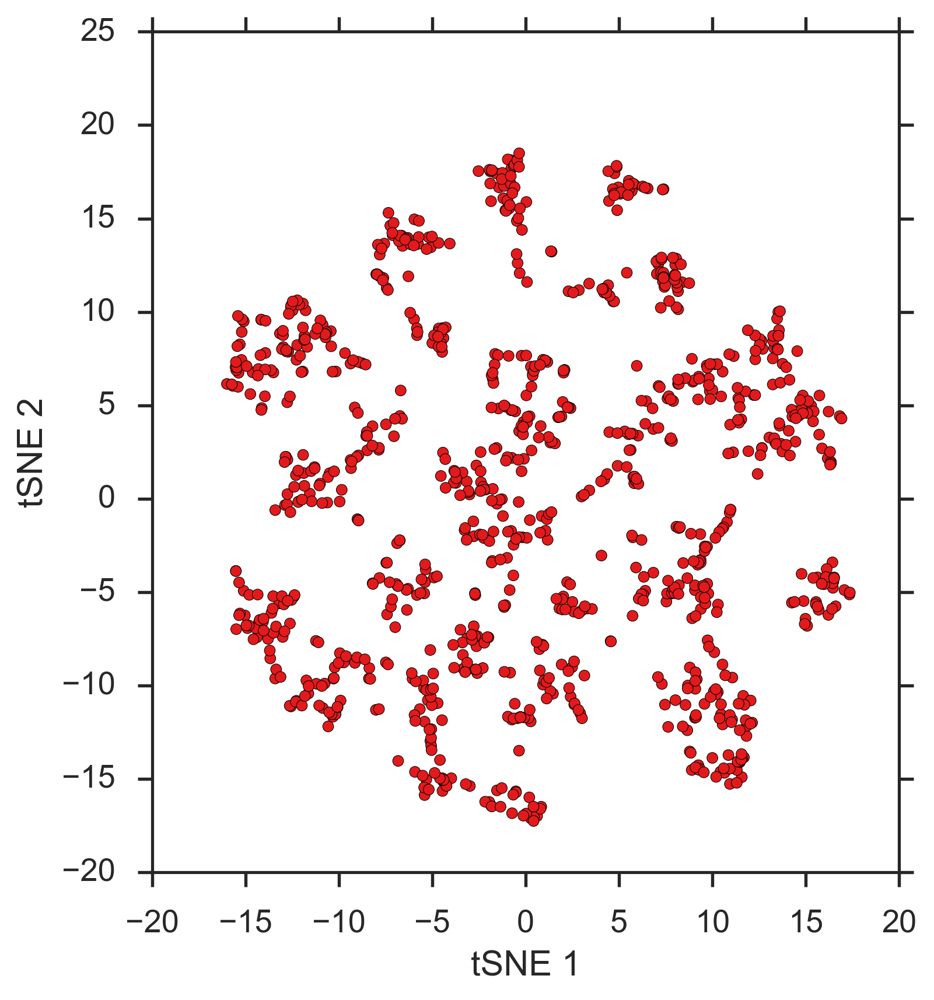

In [61]:
# Calculate TSNE
reload(sct)
from sklearn.manifold import TSNE

for i in range(18,19): # PC = i
    myPCA = sct.PCA(Z, X, i) # number of significant PCs was determined using shuffling performed elsewhere in parallel fashion
    myPCA.pca()
    Z_pca = pd.DataFrame(myPCA.X_pca.T)

    for j in range(15,16): # perplexity = j
        reload(sct)
        from sklearn.manifold import TSNE
        myTSNE = sct.TSNE(Z_pca, X, df_libs)
        
        myTSNE.calc_TSNE(perplexity=j, learning_rate=500)
        fig, ax = plt.subplots(1, 1, figsize=(6,6))
        myTSNE.plot(fig, ax, colorMode="genotype")
        #ax.set_title(str(i)+"PCs_" + str(j) +"perplexity_lr500" , y=1.02)
        fig.savefig("../Figure/Fig_S1/Fig1_ICIM_ORN_408Genes.pdf")

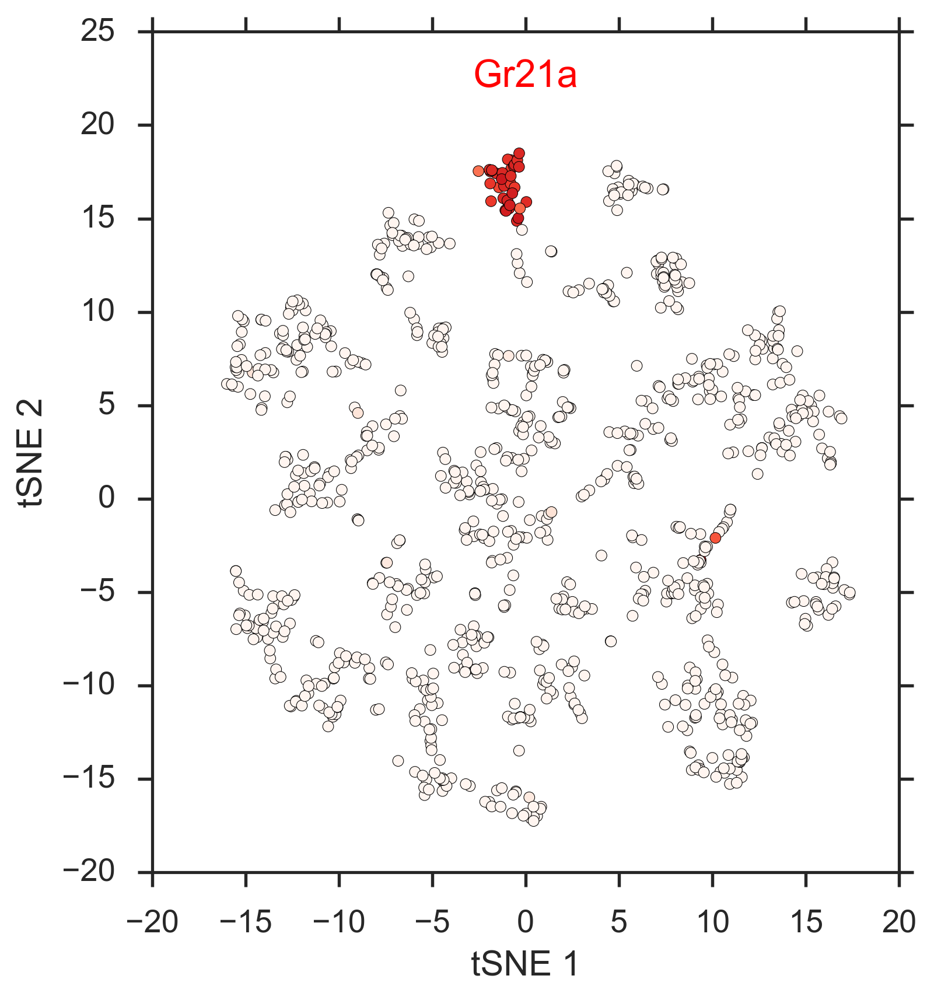

In [64]:
#names_EarlyOr = ["Gr21a","DIP-epsilon","CG31676","Ir75d","Or43a","Or47b","Or47a","fru"]
myGenes = ["Gr21a"]
#myGenes = names_EarlyOr

reload(sct)
from sklearn.manifold import TSNE


for gene in myGenes:
    fig, ax = plt.subplots(1, 1, figsize=(6,6))
    sc = myTSNE.plot(fig, ax, colorBy=gene, colorMode="gene",cmap="Reds")
    ax.set_aspect("equal")
    ax.set_title(gene, color ="r", y= 0.92)
    plt.tight_layout()
    fig.savefig("../Figure/Fig_2/Fig2_ORN_" + gene + ".pdf")


# Check if batch effects drive the clustering

In [65]:
df_libs = pd.read_csv("../data/libs_color3_PN_ORN_batch.csv", sep=",", header=0, index_col=0) # sample info

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1016
[t-SNE] Computed conditional probabilities for sample 1016 / 1016
[t-SNE] Mean sigma: 0.214192
[t-SNE] Iteration 25: error = 1.9991512, gradient norm = 0.0079487
[t-SNE] Iteration 50: error = 1.7835026, gradient norm = 0.0059780
[t-SNE] Iteration 75: error = 1.2907323, gradient norm = 0.0023776
[t-SNE] Iteration 100: error = 1.2215338, gradient norm = 0.0020045
[t-SNE] Error after 100 iterations with early exaggeration: 1.221534
[t-SNE] Iteration 125: error = 1.1194519, gradient norm = 0.0015110
[t-SNE] Iteration 150: error = 1.0901717, gradient norm = 0.0013704
[t-SNE] Iteration 175: error = 1.0831081, gradient norm = 0.0013386
[t-SNE] Iteration 200: error = 1.0812049, gradient norm = 0.0013296
[t-SNE] Iteration 225: error = 1.0806830, gradient norm = 0.0013255
[t-SNE] Iteration 250: error = 1.0805309, gradient norm = 0.0013245
[t-SNE] Iteration 275: error = 1.0804955, gradient 

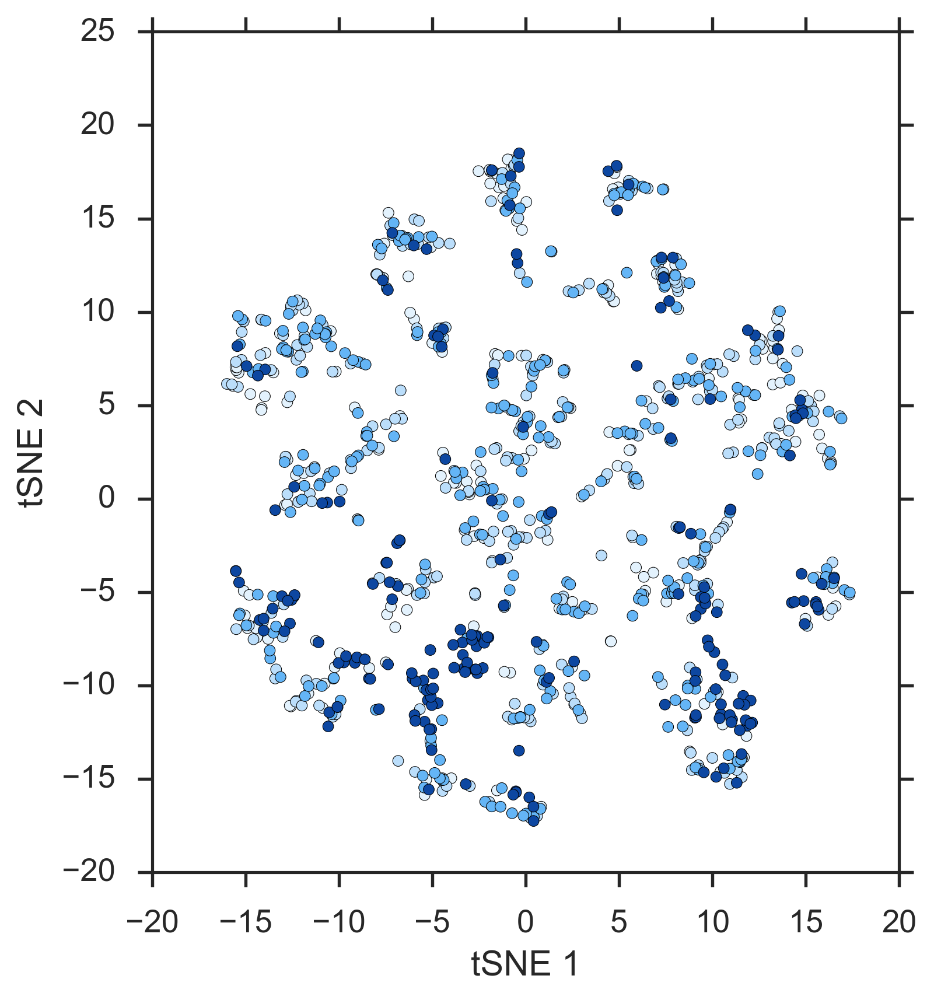

In [66]:
# Calculate TSNE
reload(sct)
from sklearn.manifold import TSNE

for i in range(18,19): # PC = i
    myPCA = sct.PCA(Z, X, i) # number of significant PCs was determined using shuffling performed elsewhere in parallel fashion
    myPCA.pca()
    Z_pca = pd.DataFrame(myPCA.X_pca.T)

    for j in range(15,16): # perplexity = j
        reload(sct)
        from sklearn.manifold import TSNE
        myTSNE = sct.TSNE(Z_pca, X, df_libs)
        
        myTSNE.calc_TSNE(perplexity=j, learning_rate=500)
        fig, ax = plt.subplots(1, 1, figsize=(6,6))
        myTSNE.plot(fig, ax, colorMode="genotype")
        #ax.set_title(str(i)+"PCs_" + str(j) +"perplexity_lr500" , y=1.02)
        fig.savefig("../Figure/Fig_S1/FigS1_ICIM_ORN_408Genes_batch.pdf")

# Use AM29_GAL4 and 85A10 ORNs to decode cluster identities

In [67]:
df_libs = pd.read_csv("../data/libs_color3.csv", sep=",", header=0, index_col=0) # sample info

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1016
[t-SNE] Computed conditional probabilities for sample 1016 / 1016
[t-SNE] Mean sigma: 0.214192
[t-SNE] Iteration 25: error = 1.9991512, gradient norm = 0.0079487
[t-SNE] Iteration 50: error = 1.7835026, gradient norm = 0.0059780
[t-SNE] Iteration 75: error = 1.2907323, gradient norm = 0.0023776
[t-SNE] Iteration 100: error = 1.2215338, gradient norm = 0.0020045
[t-SNE] Error after 100 iterations with early exaggeration: 1.221534
[t-SNE] Iteration 125: error = 1.1194519, gradient norm = 0.0015110
[t-SNE] Iteration 150: error = 1.0901717, gradient norm = 0.0013704
[t-SNE] Iteration 175: error = 1.0831081, gradient norm = 0.0013386
[t-SNE] Iteration 200: error = 1.0812049, gradient norm = 0.0013296
[t-SNE] Iteration 225: error = 1.0806830, gradient norm = 0.0013255
[t-SNE] Iteration 250: error = 1.0805309, gradient norm = 0.0013245
[t-SNE] Iteration 275: error = 1.0804955, gradient 

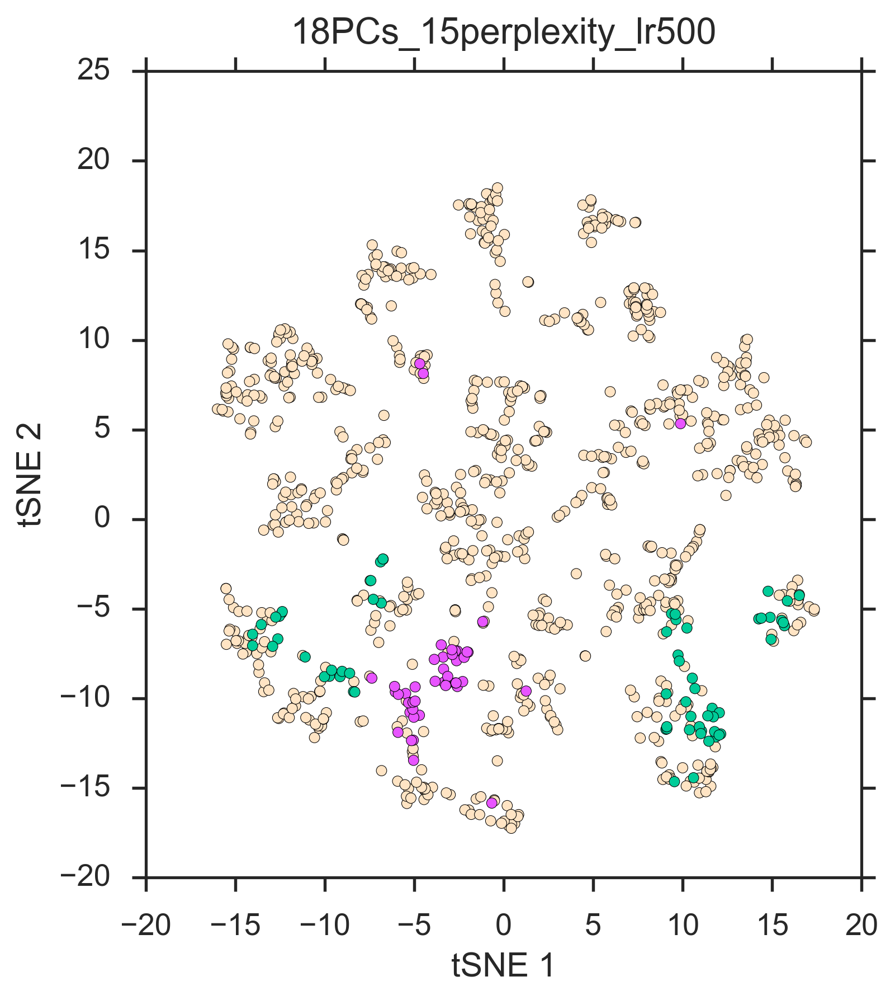

In [69]:
# Calculate TSNE
reload(sct)
from sklearn.manifold import TSNE

for i in range(18,19): # PC = i
    myPCA = sct.PCA(Z, X, i) # number of significant PCs was determined using shuffling performed elsewhere in parallel fashion
    myPCA.pca()
    Z_pca = pd.DataFrame(myPCA.X_pca.T)

    for j in range(15,16): # perplexity = j
        reload(sct)
        from sklearn.manifold import TSNE
        myTSNE = sct.TSNE(Z_pca, X, df_libs)
        
        myTSNE.calc_TSNE(perplexity=j, learning_rate=500)
        fig, ax = plt.subplots(1, 1, figsize=(6,6))
        myTSNE.plot(fig, ax, colorMode="genotype")
        ax.set_title(str(i)+"PCs_" + str(j) +"perplexity_lr500" , y=1.02)
        fig.savefig("../Figure/Fig_2/Fig2_ICIM_ORN_AM29_85A10.pdf")

# HDBSCAN to call clusters

In [70]:
import hdbscan
clusterer = hdbscan.HDBSCAN(min_cluster_size=6, min_samples=6).fit(myTSNE.X_tsne)
labels_HDBSCAN = clusterer.labels_
print "Clusters", max(labels_HDBSCAN)+1

Clusters 33


In [71]:
sys.path.append("../resources/")
import sct
reload(sct)

<module 'sct' from '../resources/sct.pyc'>

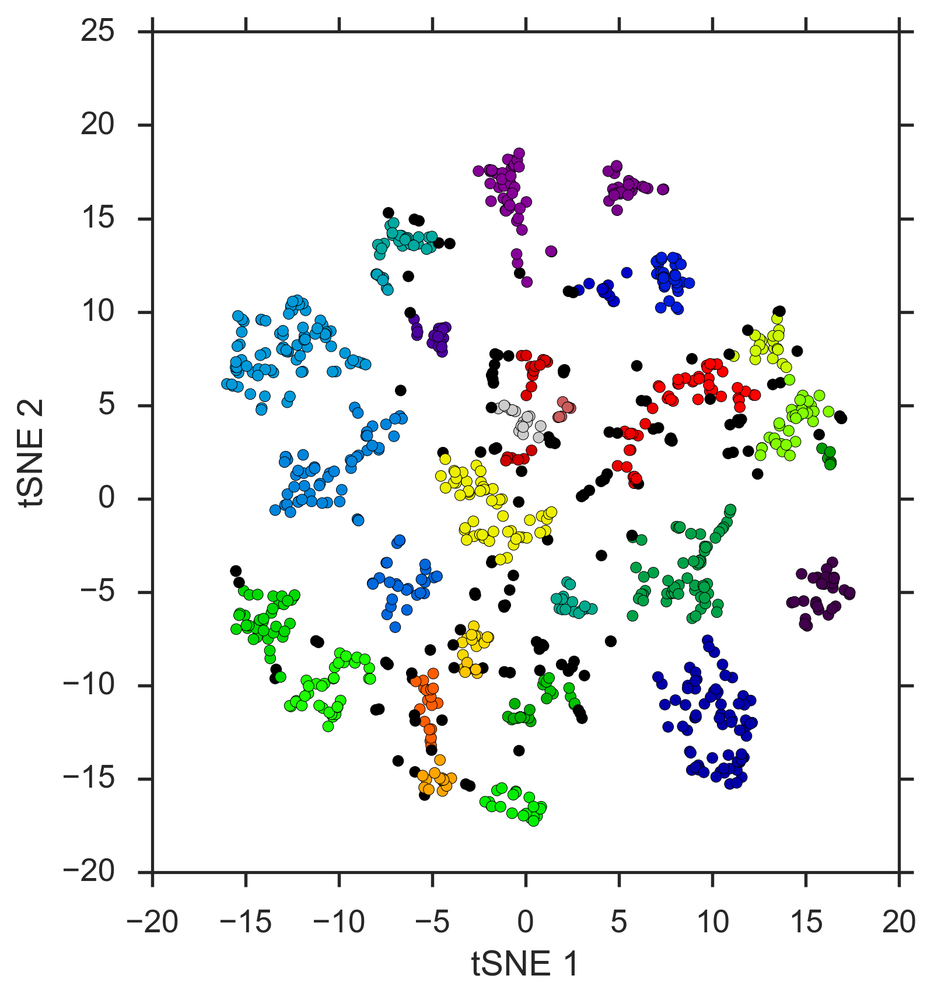

In [72]:
# Plot TSNE colored by cluster assignment with labels
fig, ax = plt.subplots(1, 1, figsize=(6,6))
myTSNE.plot(fig, ax, colorMode="custom", colorBy=labels_HDBSCAN, cmap="nipy_spectral")
    
#fig.savefig("../HL_Figures_paper/Fig_1/Fig1_ICIM_ORN_408Genes_" + "HDSCAN.pdf")
fig.savefig("../Figure/Fig_1/Fig1_ICIM_ORN_408Genes_HDSCAN.pdf")

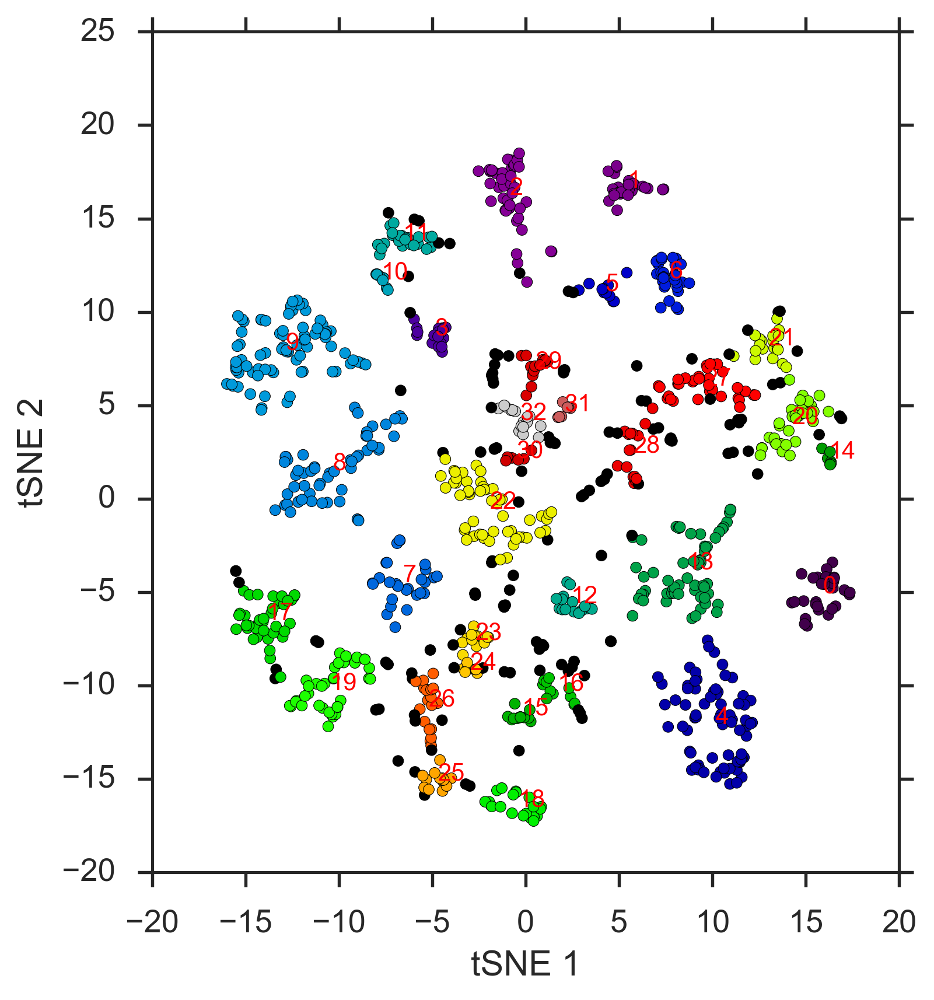

In [73]:
# Plot TSNE colored by cluster assignment with labels
fig, ax = plt.subplots(1, 1, figsize=(6,6))
myTSNE.plot(fig, ax, colorMode="custom", colorBy=labels_HDBSCAN, cmap="nipy_spectral")
    
for label in pd.Series(labels_HDBSCAN).value_counts().index:
    if label == -1: continue
    x_bar = np.mean(myTSNE.X_tsne[labels_HDBSCAN == label, 0])
    y_bar = np.mean(myTSNE.X_tsne[labels_HDBSCAN == label, 1])
    ax.text(x_bar, y_bar, label, size=10, color = 'r')
    

# Plot expression of selected genes

In [76]:
genes_Or = []
with open("../data/names_Or_genes.txt") as f:
    for line in f:
        genes_Or.append(line.rstrip())
print "genes_Or", len(genes_Or)
print genes_Or

genes_Or 53
['Or13a', 'Or19a', 'Or19b', 'Or1a', 'Or22a', 'Or22b', 'Or22c', 'Or24a', 'Or2a', 'Or30a', 'Or33a', 'Or33c', 'Or35a', 'Or42a', 'Or42b', 'Or43a', 'Or43b', 'Or45a', 'Or47a', 'Or47b', 'Or49a', 'Or49b', 'Or59b', 'Or59c', 'Or63a', 'Or65a', 'Or65b', 'Or65c', 'Or67a', 'Or67b', 'Or67c', 'Or67d', 'Or69a', 'Or71a', 'Or74a', 'Or7a', 'Or82a', 'Or83c', 'Or85a', 'Or85b', 'Or85c', 'Or85d', 'Or85e', 'Or85f', 'Or88a', 'Or92a', 'Or94a', 'Or94b', 'Or98P', 'Or98a', 'Or98b', 'Or9a', 'Orco']


In [79]:
genes_Or = [x for x in map(str, list(df_All_ORN.index)) if ("Or" in x) and ("Orc" not in x)and ("sno" not in x)and("Ork" not in x)]
genes_Or.sort()
print "genes_Or", len(genes_Or)
print genes_Or


genes_Or 54
['Or13a', 'Or19a', 'Or19b', 'Or1a', 'Or22a', 'Or22b', 'Or22c', 'Or23a', 'Or24a', 'Or2a', 'Or30a', 'Or33a', 'Or33c', 'Or35a', 'Or42a', 'Or42b', 'Or43a', 'Or43b', 'Or45a', 'Or47a', 'Or47b', 'Or49a', 'Or49b', 'Or56a', 'Or59b', 'Or59c', 'Or63a', 'Or65a', 'Or65b', 'Or65c', 'Or67a', 'Or67b', 'Or67c', 'Or67d', 'Or69a', 'Or71a', 'Or74a', 'Or7a', 'Or82a', 'Or83c', 'Or85a', 'Or85b', 'Or85c', 'Or85d', 'Or85e', 'Or85f', 'Or88a', 'Or92a', 'Or94a', 'Or94b', 'Or98P', 'Or98a', 'Or98b', 'Or9a']


In [80]:
genes_Gr = [x for x in map(str, list(df_All_ORN.index)) if ("Gr" in x) and ("sno" not in x)and ("Gri" not in x)and("Gra" not in x)and("Grd" not in x)and("Grx" not in x)]
genes_Gr.sort()
print "genes_Gr", len(genes_Gr)
print genes_Gr


genes_Gr 55
['Gr10b', 'Gr21a', 'Gr22a', 'Gr22d', 'Gr22e', 'Gr22f', 'Gr23a', 'Gr28a', 'Gr28b', 'Gr2a', 'Gr32a', 'Gr33a', 'Gr36a', 'Gr36b', 'Gr36c', 'Gr39a', 'Gr39b', 'Gr43a', 'Gr47a', 'Gr47b', 'Gr57a', 'Gr58a', 'Gr58b', 'Gr58c', 'Gr59a', 'Gr59b', 'Gr59c', 'Gr59d', 'Gr59e', 'Gr59f', 'Gr5a', 'Gr61a', 'Gr63a', 'Gr64a', 'Gr64d', 'Gr64e', 'Gr64f', 'Gr66a', 'Gr68a', 'Gr77a', 'Gr85a', 'Gr89a', 'Gr8a', 'Gr92a', 'Gr93a', 'Gr93b', 'Gr93c', 'Gr93d', 'Gr94a', 'Gr97a', 'Gr98a', 'Gr98b', 'Gr98c', 'Gr98d', 'Gr9a']


In [81]:
genes_Ir = [x for x in map(str, list(df_All_ORN.index)) if ("Ir" in x) and ("sno" not in x)and ("Irc" not in x)and ("Ire1" not in x)and ("Iris" not in x)and ("Irk" not in x)and ("Irp" not in x)and ("Irbp" not in x)]
genes_Ir.sort()
print "genes_Ir", len(genes_Ir)
print genes_Ir

genes_Ir 66
['Ir100a', 'Ir10a', 'Ir11a', 'Ir20a', 'Ir21a', 'Ir25a', 'Ir31a', 'Ir40a', 'Ir41a', 'Ir47a', 'Ir47b', 'Ir48a', 'Ir48b', 'Ir48c', 'Ir51a', 'Ir51b', 'Ir52a', 'Ir52b', 'Ir52c', 'Ir52d', 'Ir54a', 'Ir56a', 'Ir56b', 'Ir56c', 'Ir56d', 'Ir56e', 'Ir60a', 'Ir60b', 'Ir60c', 'Ir60d', 'Ir60e', 'Ir60f', 'Ir62a', 'Ir64a', 'Ir67a', 'Ir67b', 'Ir67c', 'Ir68a', 'Ir68b', 'Ir75a', 'Ir75b', 'Ir75c', 'Ir75d', 'Ir76a', 'Ir76b', 'Ir7a', 'Ir7b', 'Ir7c', 'Ir7d', 'Ir7e', 'Ir7f', 'Ir7g', 'Ir84a', 'Ir85a', 'Ir87a', 'Ir8a', 'Ir92a', 'Ir93a', 'Ir94a', 'Ir94b', 'Ir94c', 'Ir94d', 'Ir94e', 'Ir94f', 'Ir94g', 'Ir94h']


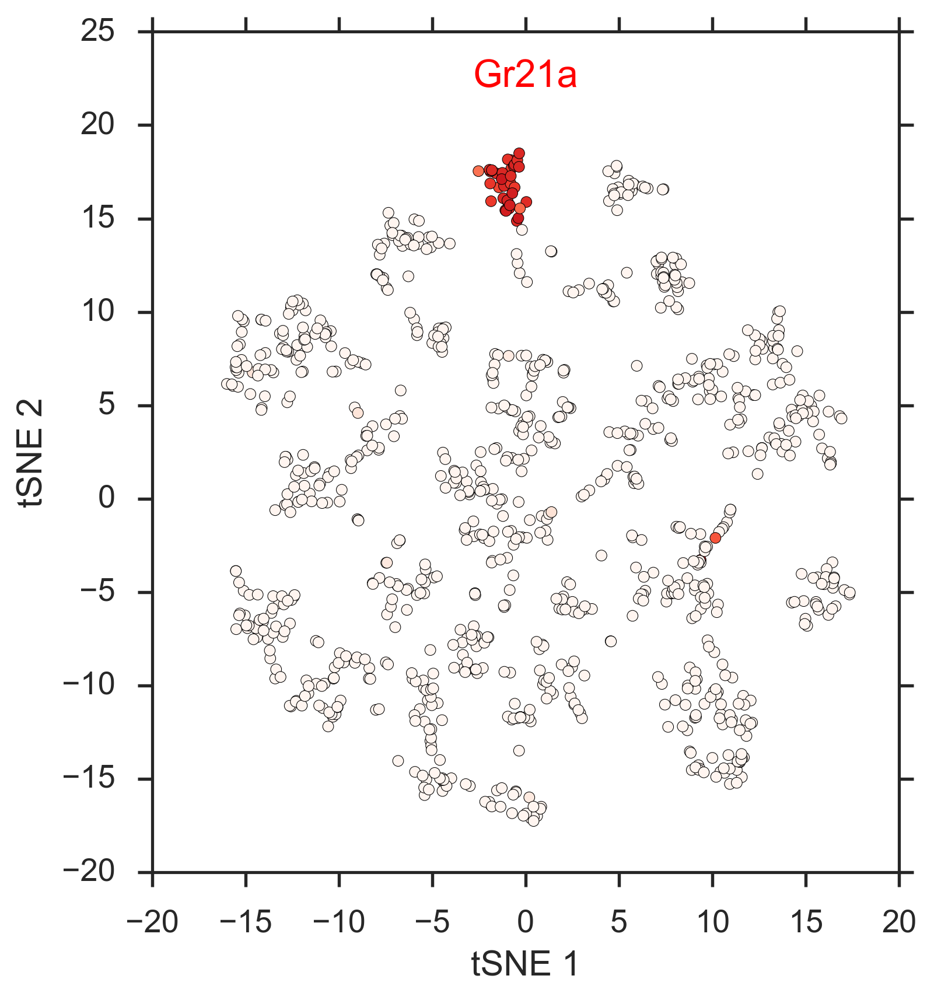

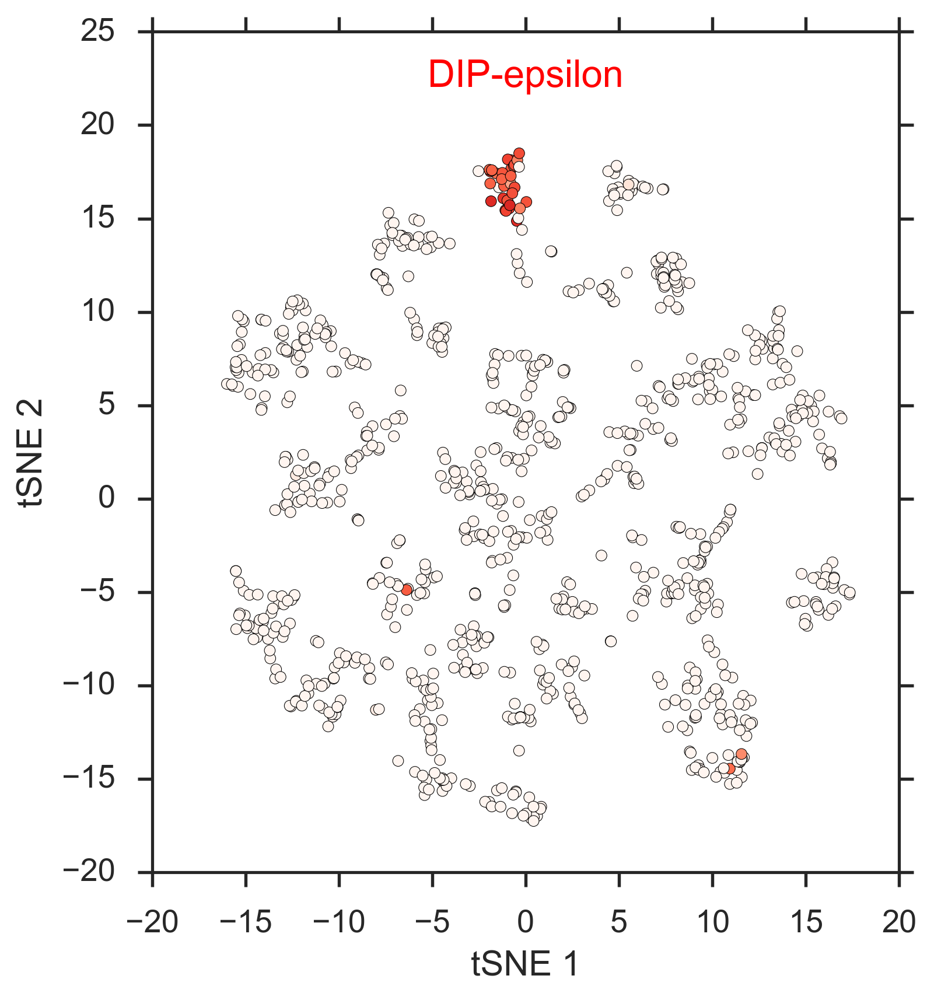

In [82]:
myGenes = ["Gr21a","DIP-epsilon"]
#myGenes = genes_Ir
for gene in myGenes:
    fig, ax = plt.subplots(1, 1, figsize=(6,6))
    sc = myTSNE.plot(fig, ax, colorBy=gene, cmap="Reds")
    ax.set_aspect("equal")
    ax.set_title(gene, color ="r", y= 0.92)
    plt.tight_layout()
    #fig.savefig("../Figure/Fig_2/ICIM_OrIrGr_" + gene + ".pdf")

# Does seq depth drive clustering?

In [84]:
df_star = pd.read_csv("../data/STAR.tab", sep="\t", header=0, index_col=0)
df_star.shape
#df_star

(4390, 6)

In [85]:
df_star_ORN = df_star.loc[names_All_ORN]
df_star_ORN = df_star_ORN.T.loc["uniquely_mapped"]
df_star_ORN = df_star_ORN.T

In [86]:
X1 = X.append(df_star_ORN, ignore_index=False)
X1.tail()

,N447Barcode_701-503,N447Barcode_701-505,N447Barcode_701-506,N447Barcode_701-513,N447Barcode_701-515,N447Barcode_701-516,N447Barcode_701-517,N447Barcode_701-518,N447Barcode_702-502,N447Barcode_702-503,...,N543Barcode_728-513,N543Barcode_728-517,N543Barcode_728-518,N543Barcode_728-522,N543Barcode_729-502,N543Barcode_729-503,N543Barcode_729-507,N543Barcode_729-508,N543Barcode_729-515,N543Barcode_729-520
symbol,,,,,,,,,,,,,,,,,,,,,
Rap2l,0.000000,8.132672,0.000000e+00,8.613655e+00,5.675744e+00,5.672905,4.226945,0.000000,6.075802,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.548240,2.580760,0.000000,0.000000,0.000000,0.000000
GAL4,9.667415,0.000000,0.000000e+00,0.000000e+00,2.070041e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.270239,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.077144
flp,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
mCD8-GFP,12.334993,12.760947,1.183518e+01,1.108062e+01,5.412335e+00,12.141851,12.728839,12.389057,12.754347,10.382692,...,13.213677,13.976786,11.831865,12.647966,11.704048,10.495303,10.555347,12.774836,11.629388,0.000000
uniquely_mapped,872420.000000,768555.000000,1.002640e+06,1.048222e+06,1.014900e+06,779798.000000,694286.000000,823438.000000,434028.000000,579712.000000,...,759655.000000,715593.000000,801244.000000,762787.000000,562834.000000,892480.000000,922325.000000,697896.000000,804759.000000,471188.000000


In [88]:
Max_v = X1.max(axis=1).loc["uniquely_mapped"]
Min_v = X1.min(axis=1).loc["uniquely_mapped"]
print "Max=", Max_v
print "Min=", Min_v

 Max= 2598117.0
Min= 100109.0


In [89]:
df_libs = pd.read_csv("../data/libs_color3_PN_ORN.csv", sep=",", header=0, index_col=0) # sample info

X1.shape
Z = X1.loc[names_ORN_ICIM]
Z.shape  

(408, 1016)

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1016
[t-SNE] Computed conditional probabilities for sample 1016 / 1016
[t-SNE] Mean sigma: 0.214192
[t-SNE] Iteration 25: error = 1.9991512, gradient norm = 0.0079487
[t-SNE] Iteration 50: error = 1.7835026, gradient norm = 0.0059780
[t-SNE] Iteration 75: error = 1.2907323, gradient norm = 0.0023776
[t-SNE] Iteration 100: error = 1.2215338, gradient norm = 0.0020045
[t-SNE] Error after 100 iterations with early exaggeration: 1.221534
[t-SNE] Iteration 125: error = 1.1194519, gradient norm = 0.0015110
[t-SNE] Iteration 150: error = 1.0901717, gradient norm = 0.0013704
[t-SNE] Iteration 175: error = 1.0831081, gradient norm = 0.0013386
[t-SNE] Iteration 200: error = 1.0812049, gradient norm = 0.0013296
[t-SNE] Iteration 225: error = 1.0806830, gradient norm = 0.0013255
[t-SNE] Iteration 250: error = 1.0805309, gradient norm = 0.0013245
[t-SNE] Iteration 275: error = 1.0804955, gradient 

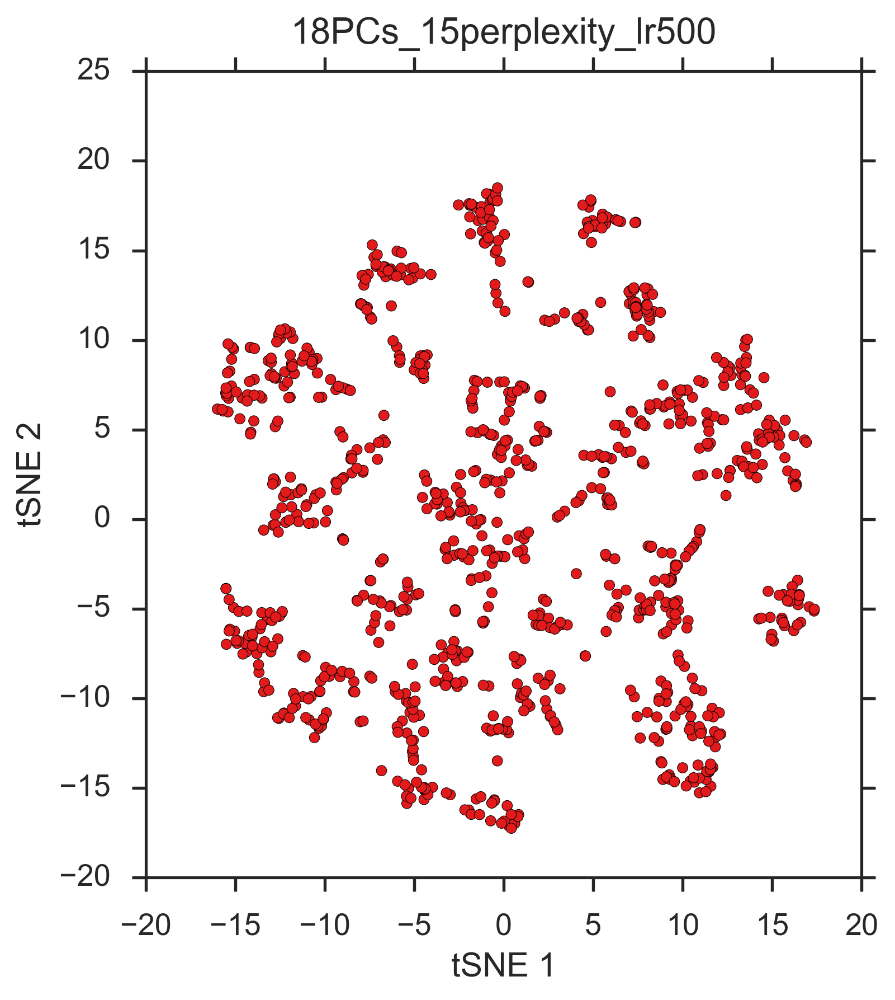

In [90]:
# Calculate TSNE
reload(sct)
from sklearn.manifold import TSNE

for i in range(18,19): # PC = i
    myPCA = sct.PCA(Z, X1, i) # number of significant PCs was determined using shuffling performed elsewhere in parallel fashion
    myPCA.pca()
    Z_pca = pd.DataFrame(myPCA.X_pca.T)

    for j in range(15,16): # perplexity = j
        reload(sct)
        from sklearn.manifold import TSNE
        myTSNE = sct.TSNE(Z_pca, X1, df_libs)
        
        myTSNE.calc_TSNE(perplexity=j, learning_rate=500)
        fig, ax = plt.subplots(1, 1, figsize=(6,6))
        myTSNE.plot(fig, ax, colorMode="genotype")
        ax.set_title(str(i)+"PCs_" + str(j) +"perplexity_lr500" , y=1.02)


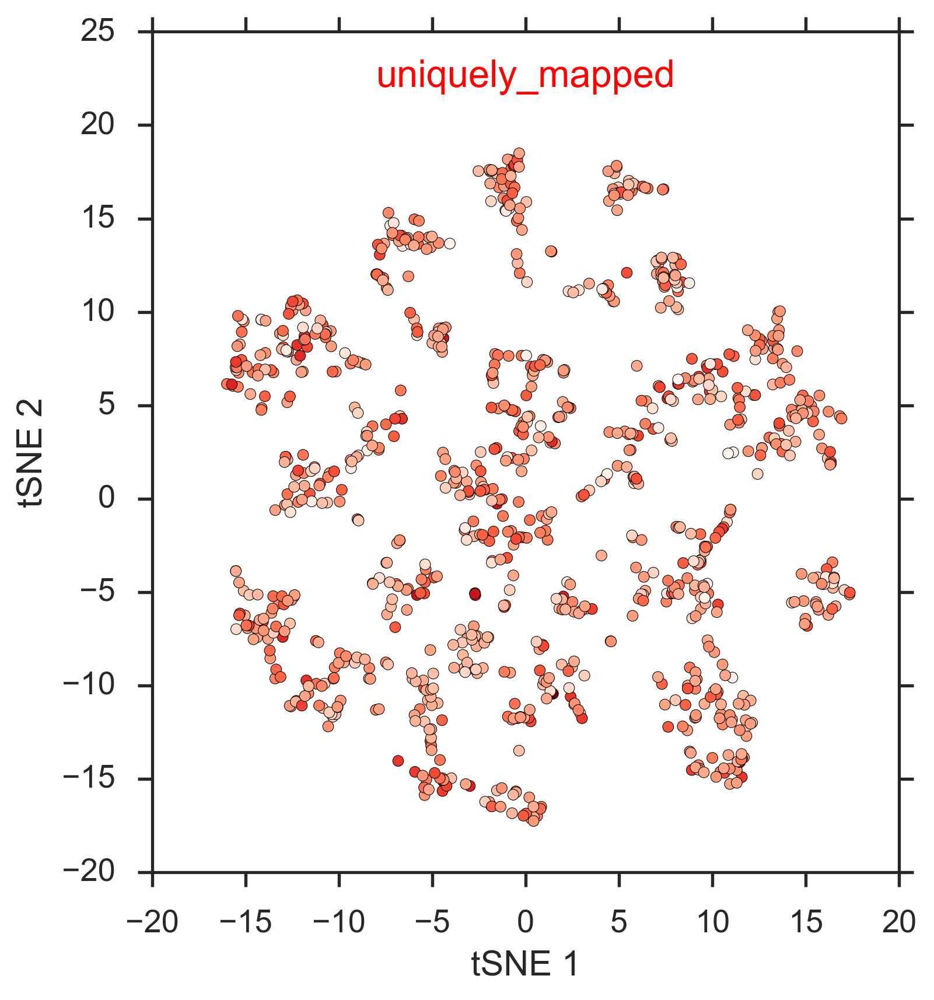

In [91]:
names_EarlyOr = ["uniquely_mapped"]
myGenes = names_EarlyOr
for gene in myGenes:
    fig, ax = plt.subplots(1, 1, figsize=(6,6))
    sc = myTSNE.plot(fig, ax, colorBy=gene, cmap="Reds", vmin=Min_v, vmax=Max_v)
    ax.set_aspect("equal")
    ax.set_title(gene, color ="r", y= 0.92)
    plt.tight_layout()
    fig.savefig("../Figure/Fig_S1/FigS1_ICIM_ORN_408Genes_" + "seq_depth.pdf")


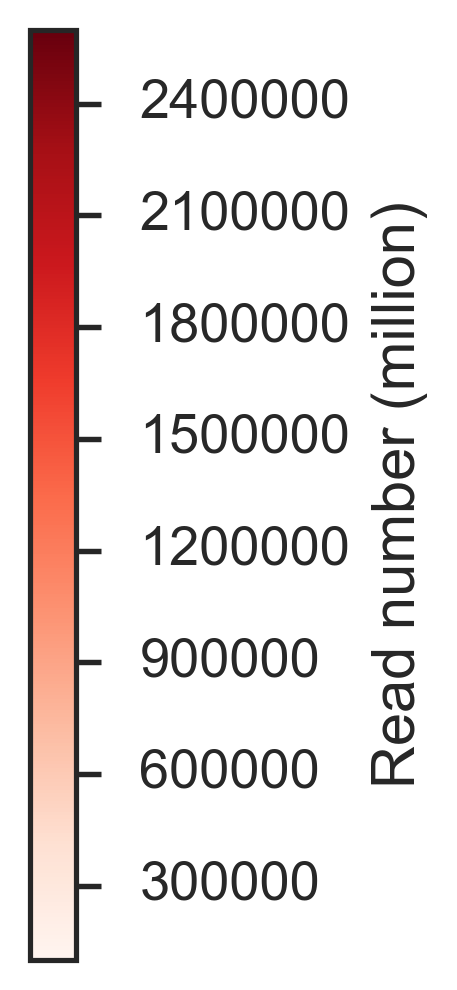

In [92]:
x = [0, 16]
y = [0, 16]
c = [Min_v, Max_v]
fig, ax = plt.subplots(1, 1, figsize=(6,4))
sc = ax.scatter(x, y, c=c, cmap="Reds")
plt.gca().set_visible(False)
fig.colorbar(sc, label="Read number (million)")
fig.savefig("../Figure/Fig_S1/FigS1_ICIM_ORN_408Genes_" + "seq_depth2.pdf")

# Whether Or/Gr/Ir genes in the ICIM expression drive clustering?

In [95]:
names_ORN_ICIM = []
with open("../data/ICIM_ORN_408_Genes.txt") as f:
    for line in f:
        names_ORN_ICIM.append(line.rstrip())
print "names_ORN_ICIM", len(names_ORN_ICIM)

names_ORN_ICIM 408


In [96]:
print "Ors in ICIM:", set(names_ORN_ICIM)&set(genes_Or)
print "Grs in ICIM:", set(names_ORN_ICIM)&set(genes_Gr)
print "Irs in ICIM:", set(names_ORN_ICIM)&set(genes_Ir)

Ors in ICIM: set([])
Grs in ICIM: set(['Gr21a', 'Gr93a'])
Irs in ICIM: set(['Ir75d'])


In [97]:
print "only Gr21a, Gr93a and Ir75d in the ICIM"

only Gr21a, Gr93a and Ir75d in the ICIM


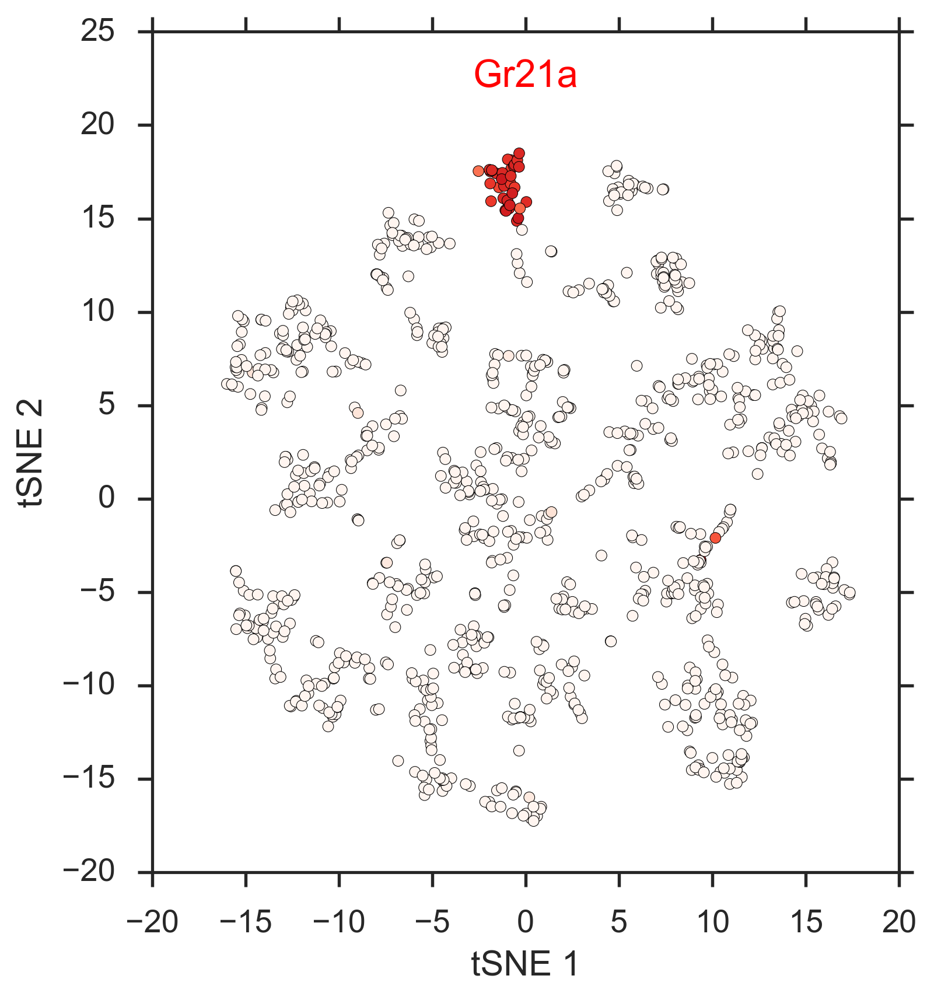

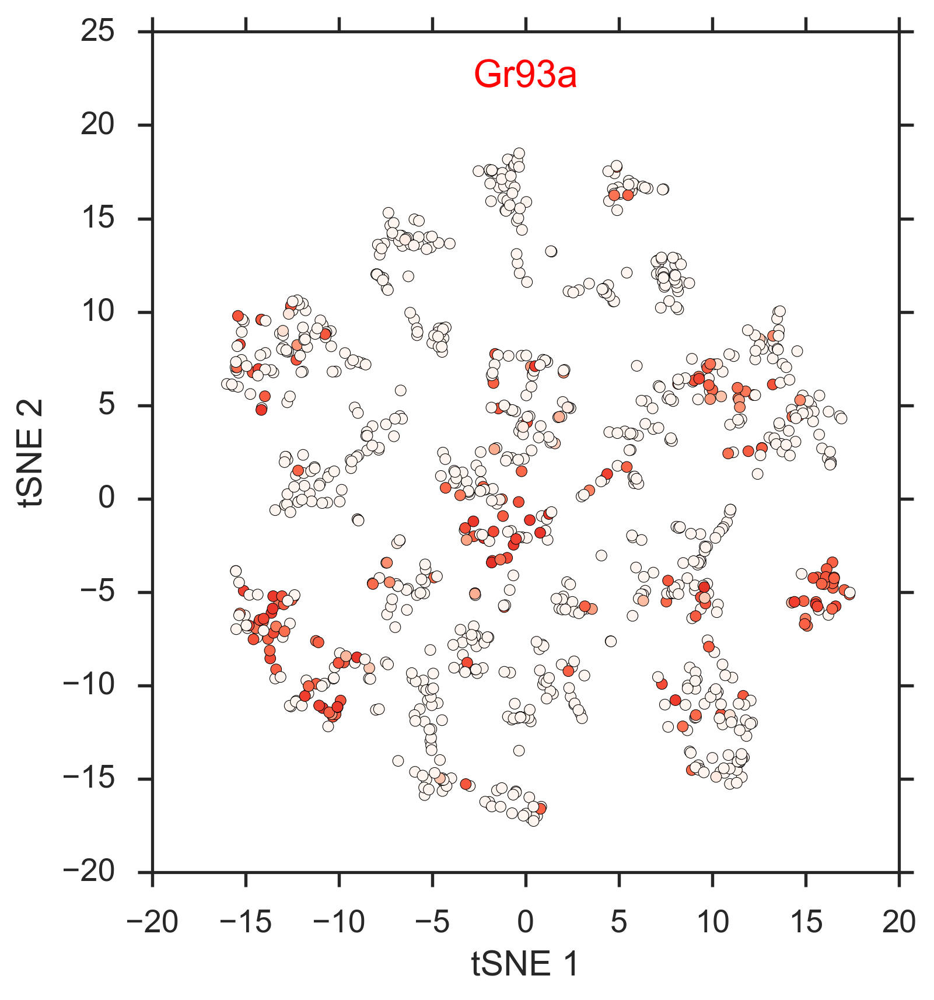

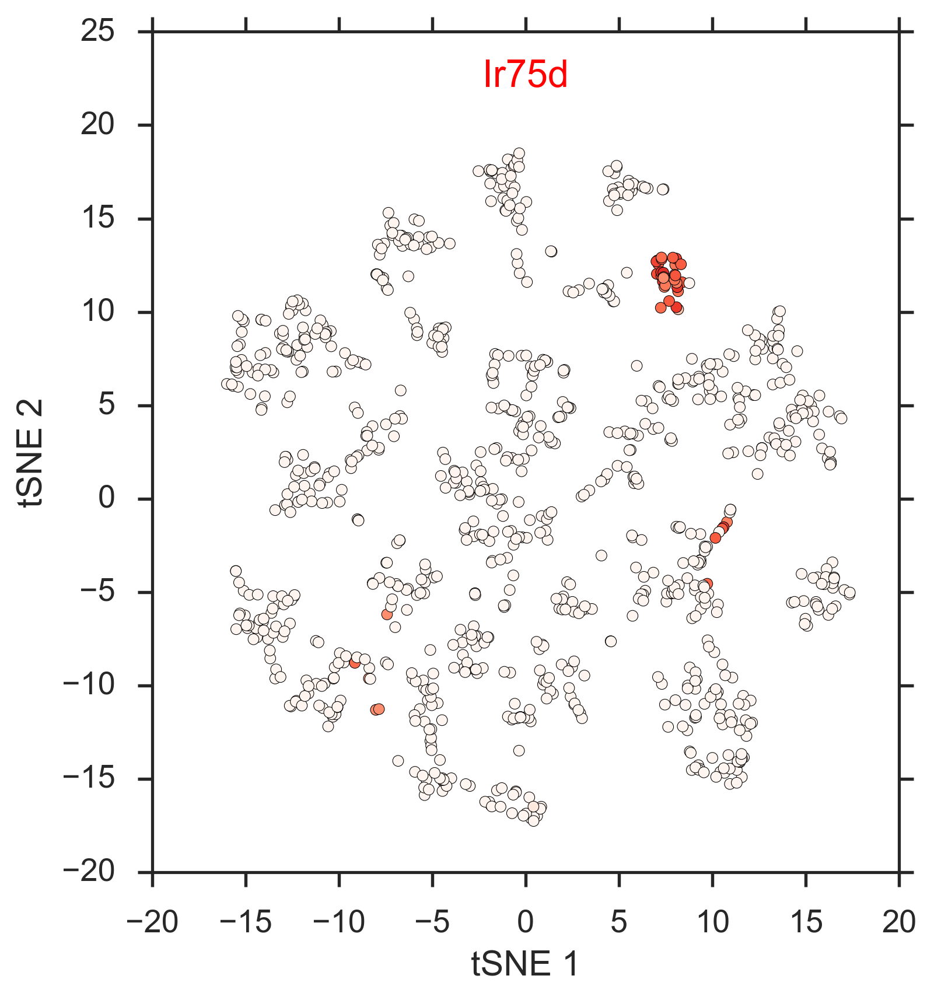

In [98]:
myGenes = ["Gr21a","Gr93a","Ir75d"]
#myGenes = genes_Ir
for gene in myGenes:
    fig, ax = plt.subplots(1, 1, figsize=(6,6))
    sc = myTSNE.plot(fig, ax, colorBy=gene, cmap="Reds")
    ax.set_aspect("equal")
    ax.set_title(gene, color ="r", y= 0.92)
    plt.tight_layout()
    #fig.savefig("../Figures/Fig_S2/ICIM_" + gene + ".pdf")

# Use 407 ICIM Genes without Gr21a

In [112]:
names_ORN_ICIM = []
with open("../data/ICIM_ORN_408_Genes.txt") as f:
    for line in f:
        names_ORN_ICIM.append(line.rstrip())
print "names_ORN_ICIM", len(names_ORN_ICIM)

names_ORN_ICIM 408


In [113]:
names_ORN_ICIM.remove("Gr21a")
names_ORN_ICIM_noGr21a = names_ORN_ICIM
print "names_ORN_ICIM_noGr21a:", len(names_ORN_ICIM_noGr21a)

names_ORN_ICIM_noGr21a: 407


In [114]:
df_libs = pd.read_csv("../data/libs_color3_PN_ORN.csv", sep=",", header=0, index_col=0) # sample info

X1.shape
Z = X1.loc[names_ORN_ICIM]
Z.shape  

(407, 1016)

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1016
[t-SNE] Computed conditional probabilities for sample 1016 / 1016
[t-SNE] Mean sigma: 0.215685
[t-SNE] Iteration 25: error = 2.0226068, gradient norm = 0.0080949
[t-SNE] Iteration 50: error = 1.8015527, gradient norm = 0.0060107
[t-SNE] Iteration 75: error = 1.2989229, gradient norm = 0.0024062
[t-SNE] Iteration 100: error = 1.2281605, gradient norm = 0.0020276
[t-SNE] Error after 100 iterations with early exaggeration: 1.228161
[t-SNE] Iteration 125: error = 1.1242821, gradient norm = 0.0015314
[t-SNE] Iteration 150: error = 1.0945452, gradient norm = 0.0013920
[t-SNE] Iteration 175: error = 1.0872827, gradient norm = 0.0013584
[t-SNE] Iteration 200: error = 1.0853134, gradient norm = 0.0013501
[t-SNE] Iteration 225: error = 1.0847746, gradient norm = 0.0013464
[t-SNE] Iteration 250: error = 1.0848751, gradient norm = 0.0017585
[t-SNE] Iteration 275: error = 1.0867755, gradient 

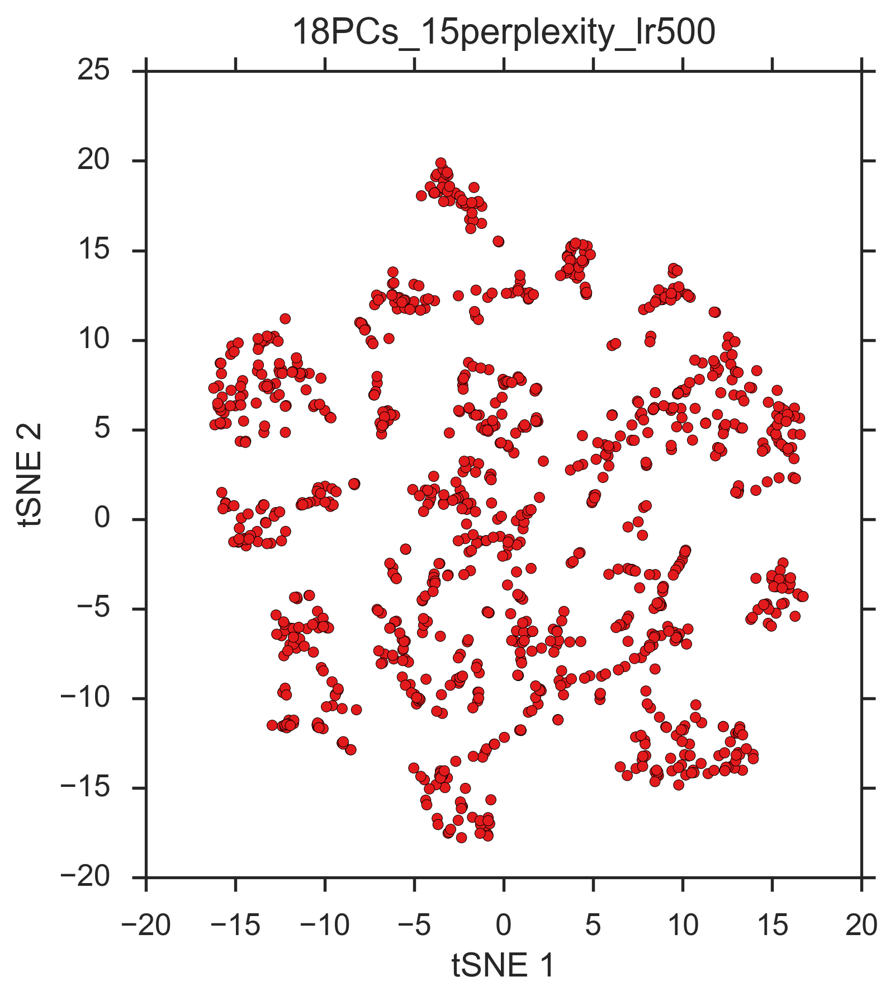

In [115]:
# Calculate TSNE
for i in range(18,19): # PC = i
    myPCA = sct.PCA(Z, X, i) # number of significant PCs was determined using shuffling performed elsewhere in parallel fashion
    myPCA.pca()
    Z_pca = pd.DataFrame(myPCA.X_pca.T)

    for j in range(15,16): # perplexity = j
        reload(sct)
        from sklearn.manifold import TSNE
        myTSNE = sct.TSNE(Z_pca, X, df_libs)
        
        myTSNE.calc_TSNE(perplexity=j, learning_rate=500)
        fig, ax = plt.subplots(1, 1, figsize=(6,6))
        myTSNE.plot(fig, ax, colorMode="genotype")
        ax.set_title(str(i)+"PCs_" + str(j) +"perplexity_lr500" , y=1.02)
        

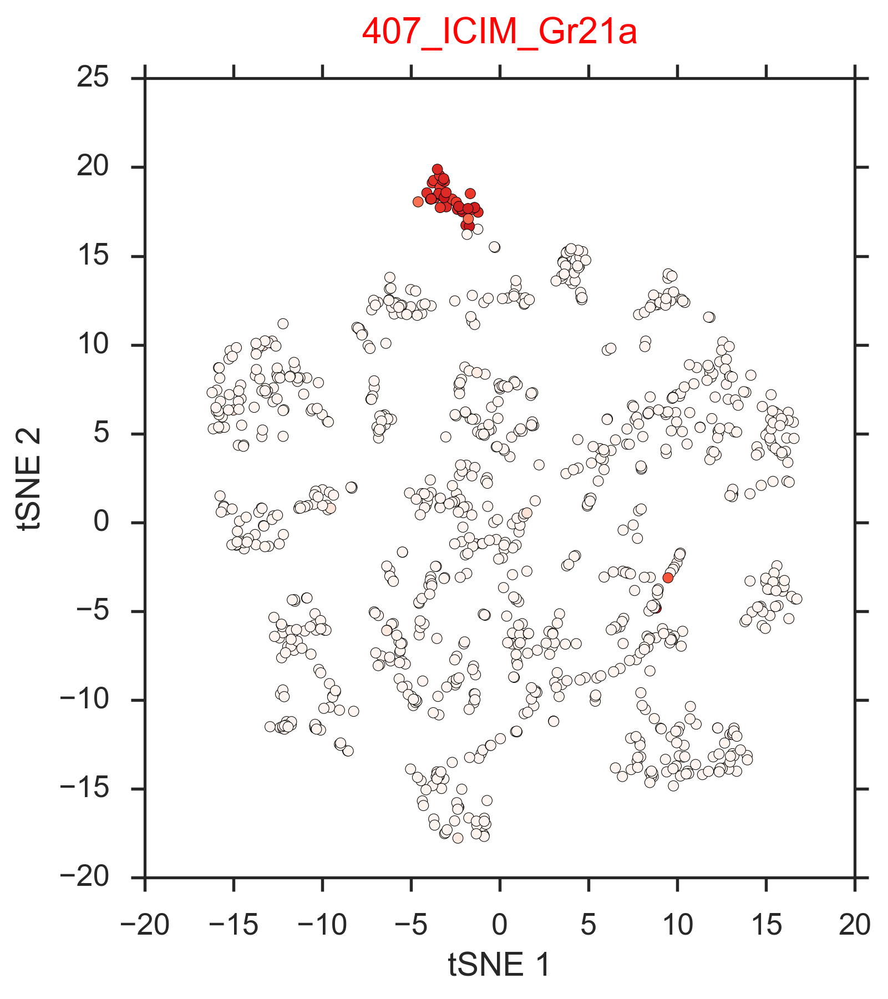

In [121]:
myGenes = ["Gr21a"]
#myGenes = genes_Ir
for gene in myGenes:
    fig, ax = plt.subplots(1, 1, figsize=(6,6))
    sc = myTSNE.plot(fig, ax, colorBy=gene, cmap="Reds")
    ax.set_aspect("equal")
    ax.set_title(gene, color ="r", y= 0.92)
    plt.tight_layout()
    ax.set_title("407_ICIM_"+gene , y=1.03)

In [123]:
names_ORN_ICIM = []
with open("../data/ICIM_ORN_408_Genes.txt") as f:
    for line in f:
        names_ORN_ICIM.append(line.rstrip())
print "names_ORN_ICIM", len(names_ORN_ICIM)

names_ORN_ICIM 408


In [124]:
names_ORN_ICIM.remove("Ir75d")
names_ORN_ICIM_noIr75d = names_ORN_ICIM
print "names_ORN_ICIM_noIr75d:", len(names_ORN_ICIM_noIr75d)

names_ORN_ICIM_noIr75d: 407


In [125]:
df_libs = pd.read_csv("../data/libs_color3_PN_ORN.csv", sep=",", header=0, index_col=0) # sample info

X1.shape
Z = X1.loc[names_ORN_ICIM_noGr21a]
Z.shape  

(407, 1016)

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 1016
[t-SNE] Computed conditional probabilities for sample 1016 / 1016
[t-SNE] Mean sigma: 0.215685
[t-SNE] Iteration 25: error = 2.0226068, gradient norm = 0.0080949
[t-SNE] Iteration 50: error = 1.8015527, gradient norm = 0.0060107
[t-SNE] Iteration 75: error = 1.2989229, gradient norm = 0.0024062
[t-SNE] Iteration 100: error = 1.2281605, gradient norm = 0.0020276
[t-SNE] Error after 100 iterations with early exaggeration: 1.228161
[t-SNE] Iteration 125: error = 1.1242821, gradient norm = 0.0015314
[t-SNE] Iteration 150: error = 1.0945452, gradient norm = 0.0013920
[t-SNE] Iteration 175: error = 1.0872827, gradient norm = 0.0013584
[t-SNE] Iteration 200: error = 1.0853134, gradient norm = 0.0013501
[t-SNE] Iteration 225: error = 1.0847746, gradient norm = 0.0013464
[t-SNE] Iteration 250: error = 1.0848751, gradient norm = 0.0017585
[t-SNE] Iteration 275: error = 1.0867755, gradient 

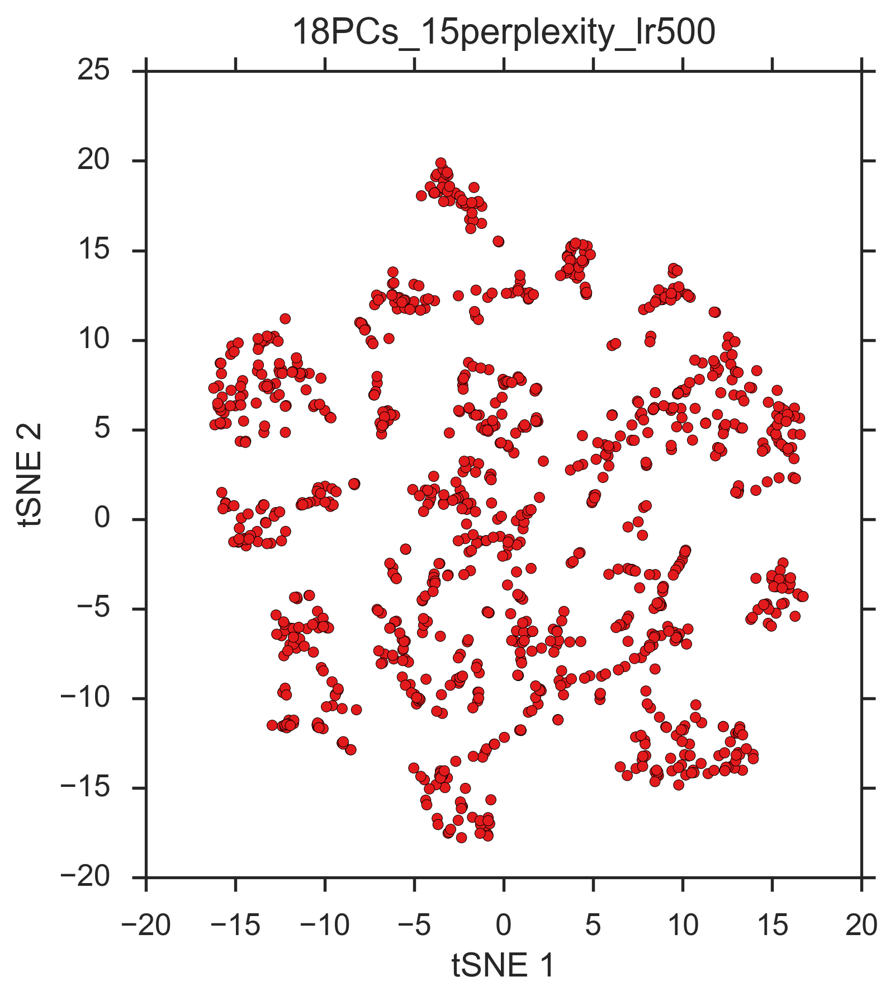

In [127]:
# Calculate TSNE
for i in range(18,19): # PC = i
    myPCA = sct.PCA(Z, X, i) # number of significant PCs was determined using shuffling performed elsewhere in parallel fashion
    myPCA.pca()
    Z_pca = pd.DataFrame(myPCA.X_pca.T)

    for j in range(15,16): # perplexity = j
        reload(sct)
        from sklearn.manifold import TSNE
        myTSNE = sct.TSNE(Z_pca, X, df_libs)
        
        myTSNE.calc_TSNE(perplexity=j, learning_rate=500)
        fig, ax = plt.subplots(1, 1, figsize=(6,6))
        myTSNE.plot(fig, ax, colorMode="genotype")
        ax.set_title(str(i)+"PCs_" + str(j) +"perplexity_lr500" , y=1.02)
        

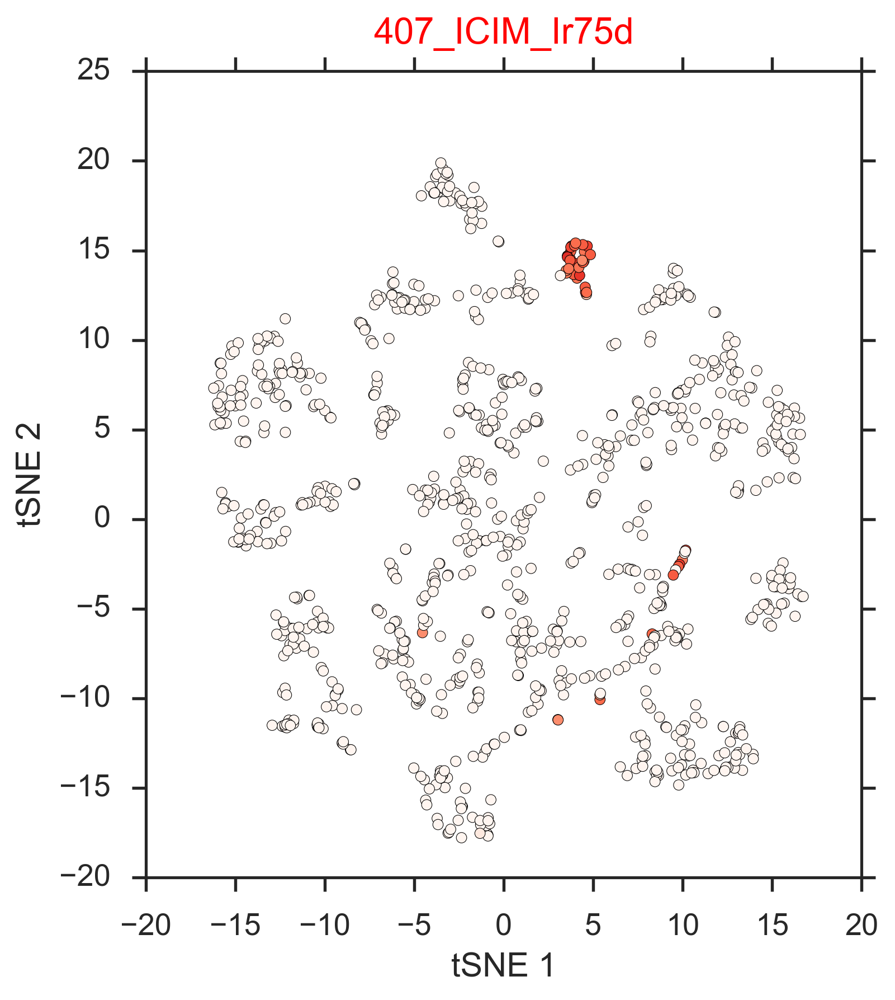

In [128]:
myGenes = ["Ir75d"]
#myGenes = genes_Ir
for gene in myGenes:
    fig, ax = plt.subplots(1, 1, figsize=(6,6))
    sc = myTSNE.plot(fig, ax, colorBy=gene, cmap="Reds")
    ax.set_aspect("equal")
    ax.set_title(gene, color ="r", y= 0.92)
    plt.tight_layout()
    ax.set_title("407_ICIM_"+ gene , y=1.02)

In [ ]:
Heatmap for detected Or, Ir, and Gr genes

In [143]:
Z = df.loc[genes_Or]
print Z.shape

(54, 1016)


[]

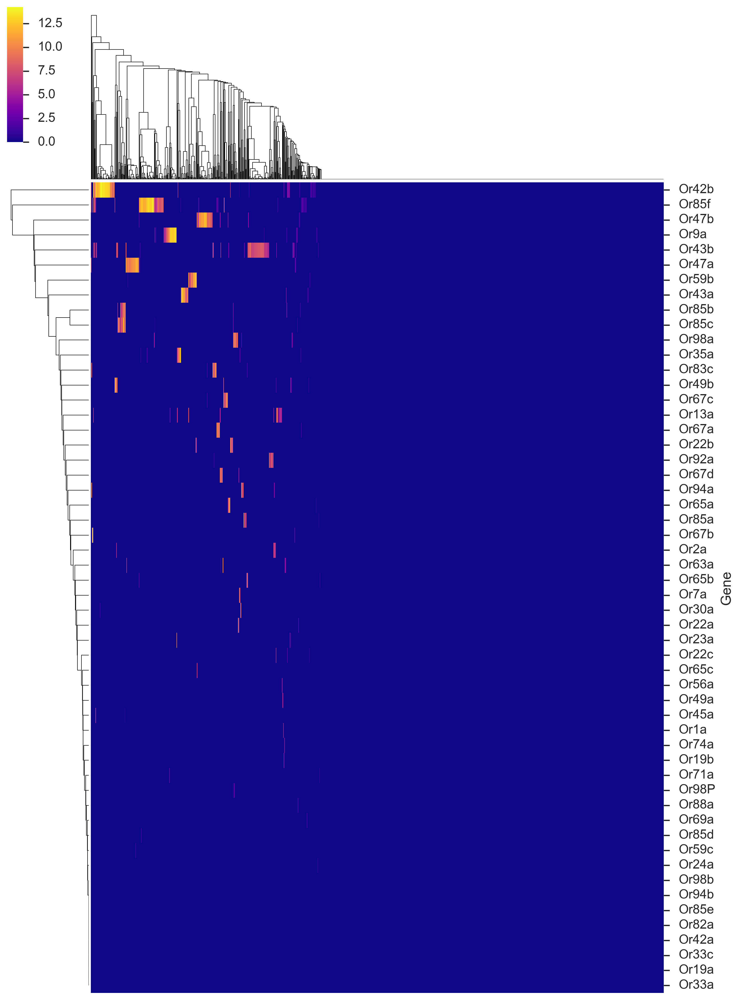

In [144]:
# Calculate clustering and plot
col_colors = df_libs.loc[Z.columns]["color"]
# cm = sns.clustermap(Z, metric="correlation", method="average", cmap="magma", figsize=(12,4), col_colors=col_colors)
cm = sns.clustermap(Z, method="average", cmap="plasma", figsize=(12,18), row_cluster=True, col_cluster=True)
plt.setp(cm.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cm.ax_heatmap.set_ylabel("Gene")
cm.ax_heatmap.set_xticks([])
cm.ax_heatmap.set_xticklabels([])
#cm.savefig("../HL_Figures_paper/Fig_2/Fig2_HeatMap_Top_Ors.pdf")

In [145]:
Z = df.loc[genes_Gr]
print Z.shape

(55, 1016)


[]

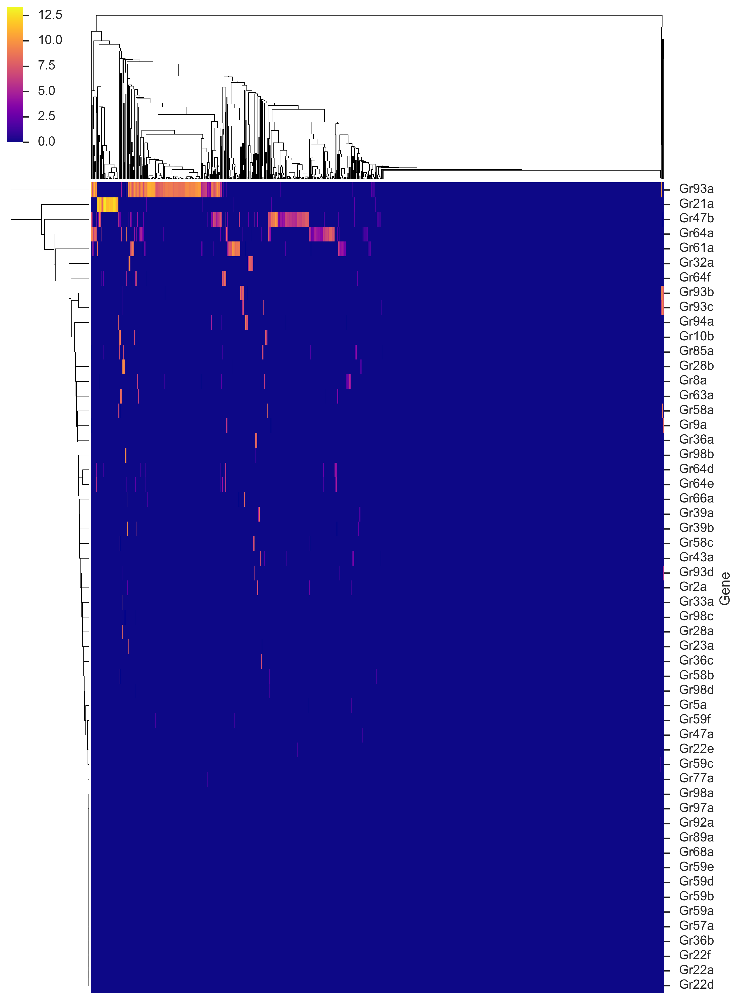

In [147]:
# Calculate clustering and plot
col_colors = df_libs.loc[Z.columns]["color"]
# cm = sns.clustermap(Z, metric="correlation", method="average", cmap="magma", figsize=(12,4), col_colors=col_colors)
cm = sns.clustermap(Z, method="average", cmap="plasma", figsize=(12,18), row_cluster=True, col_cluster=True)
plt.setp(cm.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cm.ax_heatmap.set_ylabel("Gene")
cm.ax_heatmap.set_xticks([])
cm.ax_heatmap.set_xticklabels([])


In [148]:
Z = df.loc[genes_Ir]
print Z.shape

(66, 1016)


[]

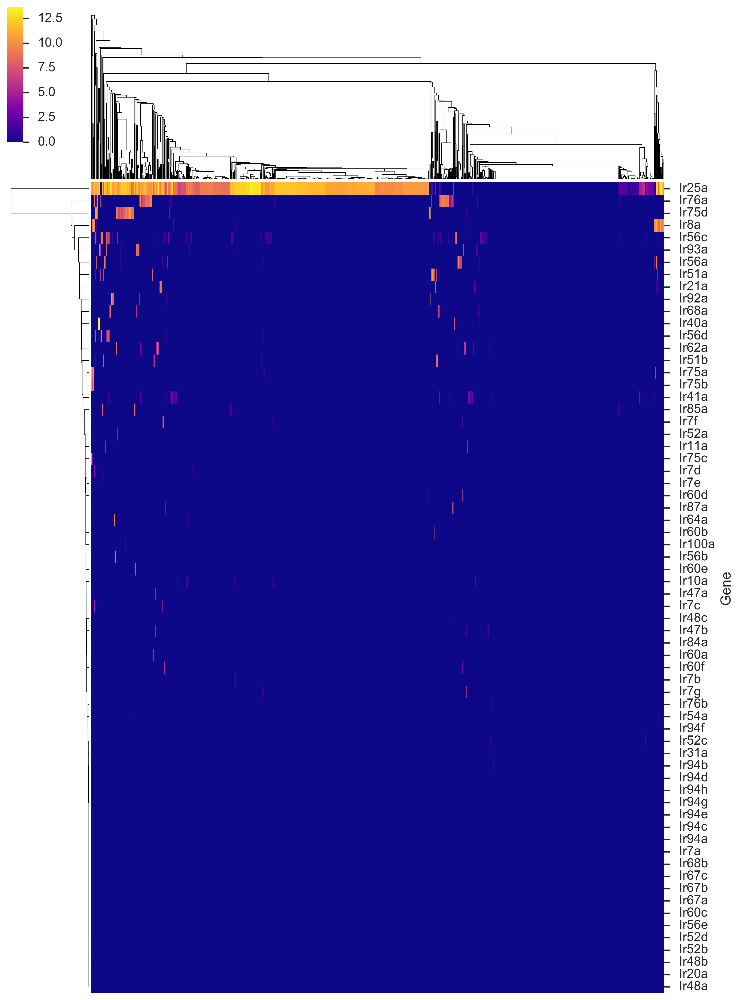

In [149]:
# Calculate clustering and plot
col_colors = df_libs.loc[Z.columns]["color"]
# cm = sns.clustermap(Z, metric="correlation", method="average", cmap="magma", figsize=(12,4), col_colors=col_colors)
cm = sns.clustermap(Z, method="average", cmap="plasma", figsize=(12,18), row_cluster=True, col_cluster=True)
plt.setp(cm.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cm.ax_heatmap.set_ylabel("Gene")
cm.ax_heatmap.set_xticks([])
cm.ax_heatmap.set_xticklabels([])


In [150]:
# curate the highly expressed olfactory receptors

In [151]:
genes_Or_ordered = ["Or42b","Gr21a","Or85c","Or85b","Or9a","Or47a",
                    "Or85f","Or43a","Or59b","Or35a","Or83c","Or47b",
                    "Or22b","Or67c","Ir75d","Or98a","Or67d",
                    "Or92a","Or43b" ]
Z = df.loc[genes_Or_ordered]
print Z.shape

(19, 1016)


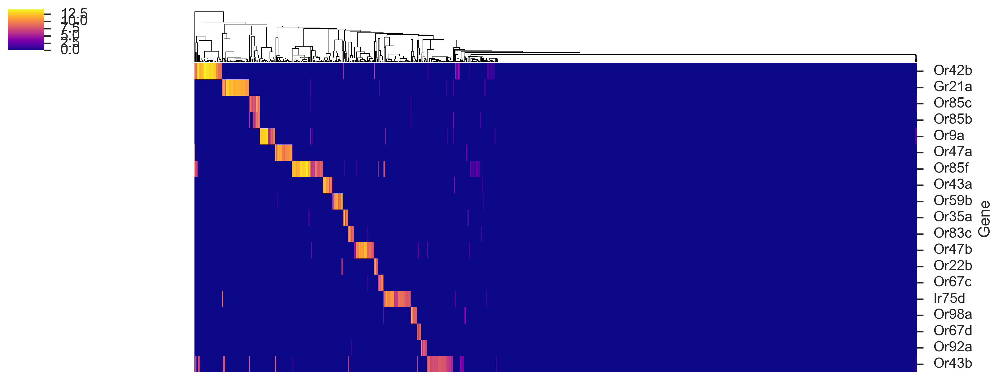

In [152]:
# Calculate clustering and plot
col_colors = df_libs.loc[Z.columns]["color"]
# cm = sns.clustermap(Z, metric="correlation", method="average", cmap="magma", figsize=(12,4), col_colors=col_colors)
#cm = sns.clustermap(Z, method="average", cmap="plasma", figsize=(15,8), col_colors=col_colors, row_cluster=False, col_cluster=True)
cm = sns.clustermap(Z, method="average", cmap="plasma", figsize=(15,6),row_cluster=False, col_cluster=True)
plt.setp(cm.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cm.ax_heatmap.set_ylabel("Gene")
cm.ax_heatmap.set_xticks([])
cm.ax_heatmap.set_xticklabels([])
cm.savefig("../Figure/Fig_2/Fig2_HeatMap_Top_OrGrIrs.pdf")

In [155]:
Z = Z.T
df_Top_Ors = pd.DataFrame(np.sort(Z.values)[:,-1:], columns=['highest_Receptor'])
print df_Top_Ors.tail()
#df_Top_Ors

    highest_Receptor
14         11.551743
15         12.244556
16          9.380548
17         10.061899
18          8.854047


In [154]:
#df_Top_Ors[df_Top_Ors["1st_Or"]>=3].count()
#print df.shape[1]
df1 = df_Top_Ors[df_Top_Ors["highest_Receptor"]>=3].count()

ratio = df1.loc["highest_Receptor"]/df.shape[1]
print "# ORN Receptor ON / # all ORNs =", ratio

# ORN Receptor ON / # all ORNs = 0.373031496063


# Dropout rate

In [129]:
df = X

# Check TF expression levels, distribution and dropout rate

In [132]:
TFs = []
with open("../resources/TFs.txt") as f:
    for line in f:
        TFs.append(line.rstrip())
        
CSMs = []
with open("../resources/CSMs.txt") as f:
    for line in f:
        CSMs.append(line.rstrip())

print "TFs", len(TFs)
print "CSMs", len(CSMs)

TFs 1045
CSMs 955


In [133]:
df_TFs = df.loc[TFs]
print "total TFs", df_TFs.shape[0]

df_CSMs = df.loc[CSMs]
print "total CSMs", df_CSMs.shape[0]

total TFs 1045
total CSMs 955


In [134]:
# take rows that there is no NAN, meaning that remove TF rows not detected in any ORN.
df_TFs = df_TFs[np.isfinite(df_TFs['N447Barcode_701-503'])]
print "Total TFs detected in one or more cells (CPM>=3)", df_TFs.shape[0]

Total TFs detected in one or more cells (CPM>=3) 993


In [135]:
# take rows that there is no NAN, meaning that remove TF rows not detected in any ORN.
df_CSMs = df_CSMs[np.isfinite(df_CSMs['N447Barcode_701-503'])]
print "Total CSMs detected in one or more cells (CPM>=3)", df_CSMs.shape[0]

Total CSMs detected in one or more cells (CPM>=3) 920


In [137]:
print "(# detected TFs)/(# detected genes):", df_TFs.shape[0]/df.shape[0]
print "(# detected CSMs)/(# detected genes):", df_CSMs.shape[0]/df.shape[0]

(# detected TFs)/(# detected genes): 0.0624214231833
(# detected CSMs)/(# detected genes): 0.0578325370883


# how many TFs/CSMs could be detected in one cell? 

In [416]:
# set threshold as log2(CSM+1) = 3
df_TFs_individual_cell = np.sum(df_TFs >= 3, axis=0)
df_CSMs_individual_cell = np.sum(df_CSMs >= 3, axis=0)

In [417]:
print "TFs:"
print "Max TFs detected in one cell", df_TFs_individual_cell.max()
print "Min TFs detected in one cell",df_TFs_individual_cell.min()
print ""

print "CSMs:"
print "Max CSMs detected in one cell", df_CSMs_individual_cell.max()
print "Min CSMs detected in one cell",df_CSMs_individual_cell.min()

TFs:
Max TFs detected in one cell 245
Min TFs detected in one cell 22

CSMs:
Max CSMs detected in one cell 195
Min CSMs detected in one cell 21


In [418]:
df_CSMs.shape

(920, 1016)

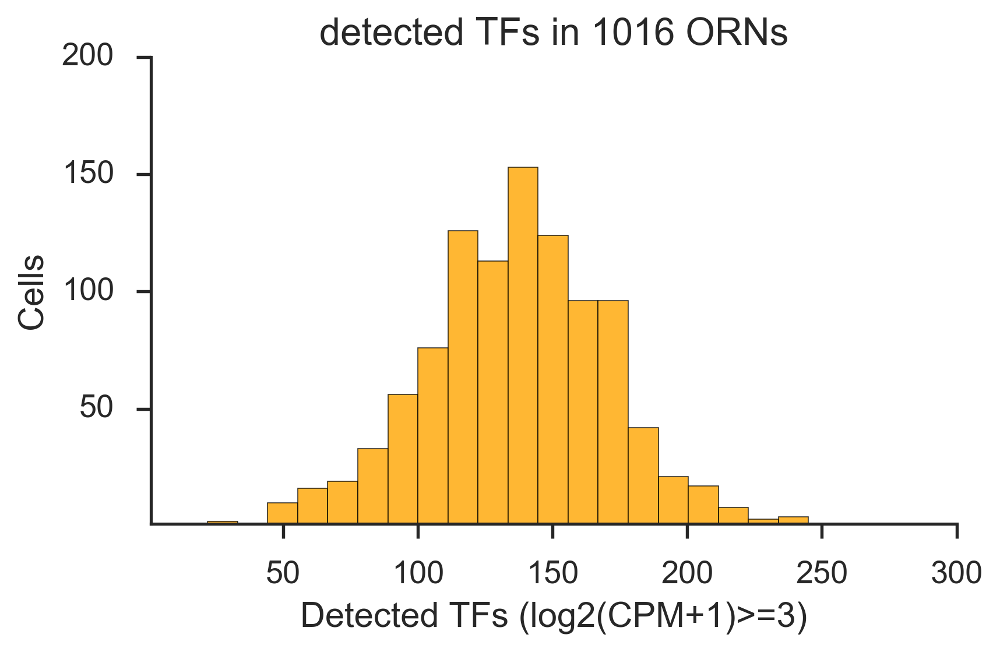

In [455]:
#plot the distribution of detected TFs

fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.hist(df_TFs_individual_cell, 20, color=['orange'],alpha = 0.8) #'crimson', 'burlywood', 'chartreuse'

plt.title("detected TFs in 1016 ORNs")
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_ylim(1, 200)
ax.set_xlim(1, 300)
ax.set_xlabel("Detected TFs (log2(CPM+1)>=3)")
ax.set_ylabel("Cells")
sns.despine()
plt.tight_layout()
fig.savefig("../HL_Figures_paper/Fig_1/FigS1_genes_distribution_TFs_ORN.pdf")

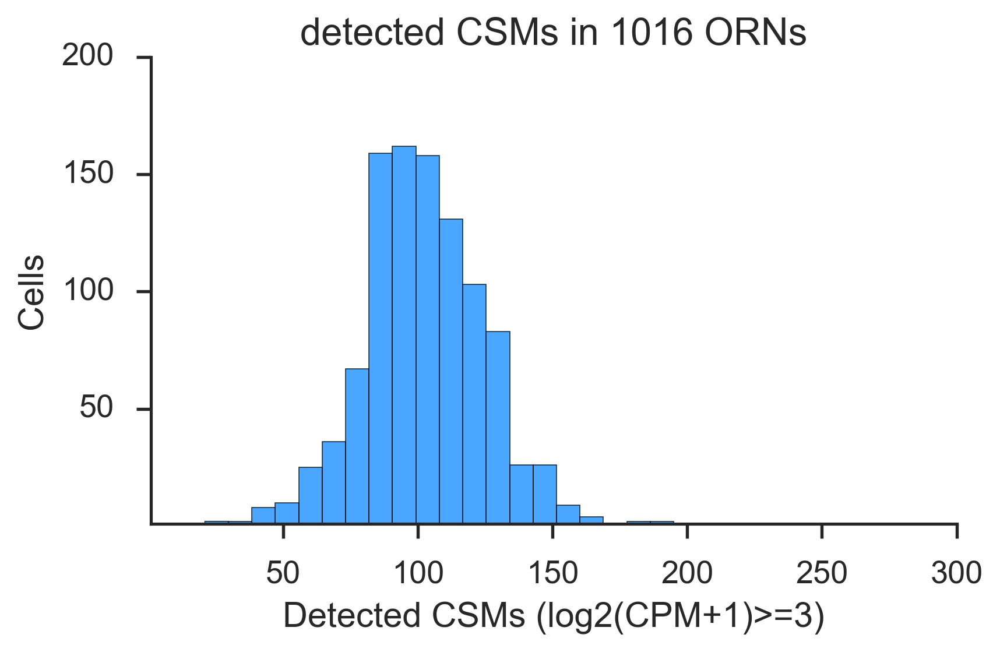

In [456]:
#plot the distribution of detected CSMs

fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.hist(df_CSMs_individual_cell, 20, color=['dodgerblue'],alpha = 0.8) #'crimson', 'burlywood', 'chartreuse'

plt.title("detected CSMs in 1016 ORNs")
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_ylim(1, 200)
ax.set_xlim(1, 300)
ax.set_xlabel("Detected CSMs (log2(CPM+1)>=3)")
ax.set_ylabel("Cells")
sns.despine()
plt.tight_layout()
fig.savefig("../HL_Figures_paper/Fig_1/FigS1_genes_distribution_CSMs_ORN.pdf")